In [1]:
using Plots
using LinearAlgebra
using GR
using ImageFiltering
using Statistics
using DSP

In [2]:
# Define parameters
nx = 100
ny=nx
mid=Int(nx/2)
nz=nx#Int((nx/2)+2)
v = 0.4

# Compute time step and spatial step
xs = range(0, stop=10, length=nx)
zs = range(0, stop=10, length=nz)
dz=diff(zs)[1]
h =diff(xs)[1]
C = 1 / 4
dt = C * h / v

# Generate time array
ts = range(0,stop=10,step=dt)
#dt=diff(ts)[1]
nt = length(ts)



159

In [3]:
X, Y ,Z= meshgrid(xs,xs,zs);

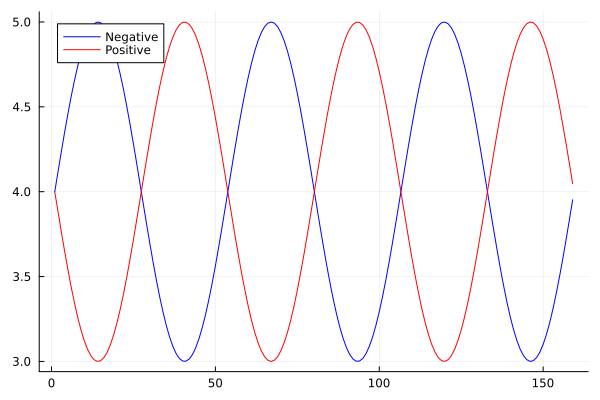

In [52]:
#y = sin.(repeat(xs',nt).-ts)
xs1=range(0,stop=10,length=41)
L=10-2.5
λ=2*L
ν=0.3#v/λ
y = (2*(sin.(2*π*ν*ts).+1)/2).+3#sin.((2*π/λ)*repeat(xs1',nt)'.-2π*ν*ts')#repeat((-exp.(-4*ts).+1)',length(xs1))
# Find indices for positive and negative values
idx_neg = findall(x -> x < 0, y)
idx_pos =findall(>(0), y)

# Create copies and modify
y1 = copy(y)
y2 = (2*(sin.(2*π*ν*(ts.-5)).+1)/2).+3#(copy(y));
#y1[idx_neg].= 0; # Set negative values to zero (0.0 for clarity)
#y2[idx_pos].= 0; # Set positive values to zero

# Plot the results
Plots.plot(y1[:], label="Negative",color="blue")  # Add label for clarity
Plots.plot!(y2[:], label="Positive", color="red")  # Plot on same figure and add label
#plot!(y1[:,1]-y2[:,1])

#legend()  # Display legend

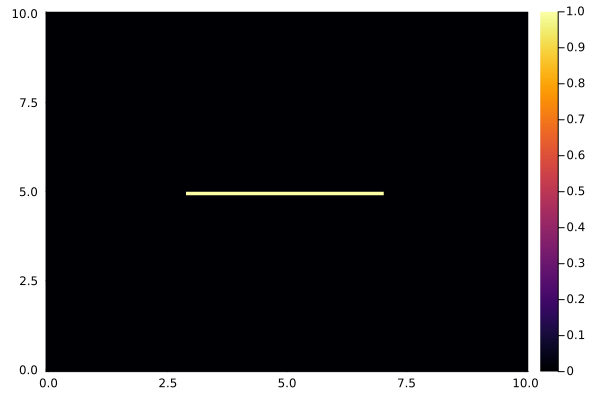

In [238]:
pos1 = zeros(nx, ny, nz);
pos2 = copy(pos1)
neg = zeros(nx, ny, nz);
mid=Int(nx/2)
#pos1[mid-2,mid-40:mid+7,mid,1].=1;
pos2[mid-20:mid+20,mid,mid,1].=1;


#neg[mid+2,mid-40:mid+8,mid,1].=1;
#neg[mid+2:mid+42,mid+8,mid,1].=1;
#idx=findall(>(0),pos1);
idx1=findall(>(0),pos2);
#idx2=findall(>(0),neg);
Plots.heatmap(xs,xs,(neg+pos1+pos2)[:,:,mid]')

## map the source $\rho$ in the cable

In [7]:
err = []
iters = 2
grid=zeros(nx,ny,nz,nt)
grid1=zeros(nx,ny,nz)
#grid2=copy(grid1)
ttt=1
#grid1[idx].=(y1[1:length(idx),ttt];)
grid1[idx1].=reverse(y1[length(idx)+1:end,ttt];)
#grid1[idx2].=y2[:,ttt];
grid[:,:,:,1]=grid1;


Plots.heatmap(grid[:,:,mid,ttt]')

LoadError: UndefVarError: idx not defined

In [5]:
function neumann(a)
    a[1,:,:] = a[2,:,:]; a[end,:,:] = a[end-1,:,:]
    a[:,1,:] = a[:,2,:]; a[:,end,:] = a[:,end-1,:]
    a[:,:,1] = a[:,:,2]; a[:,:,end] = a[:,:,end-1]
    return a
end

neumann (generic function with 1 method)

In [6]:
function lapl(U,n)
    U1=copy(U)
    for i in 1:n
        U1=copy(imfilter(U1[:,:,:], kern))
        U1 = copy(neumann(U1))
        U1[idx, i]=y1[1:length(idx),i];
        U1[idx1, i]=reverse(y1[(length(idx)+1):end,i]);
        U1[idx2, i]=y2[:,i];
    end
    return U1
end

lapl (generic function with 1 method)

In [48]:
function compute_U(U, nx, ny, nz, nt, dt, C, y1, y2)
    Ax = zeros(Float64, nx, ny, nz, nt)
    Ay = copy(Ax)
    Az = copy(Ax)
    rot = zeros(Float64, nx, ny, nz)
    ∇2 = zeros(Float64, nx, ny, nz)
    lapAx=copy(∇2)
    lapAy=copy(∇2)
    lapAz=copy(∇2)
    for i in 2:nt-1
        # Condiciones de frontera

        position = Int(argmin(abs.(xs .- y1[i])))
        position2 = Int(argmin(abs.(xs .- y2[i])))
        U[mid,mid,position,i]=10*(dt^2)
        #U[mid,position2,mid,i]=-10*dt^2
        #U[mid+7,mid,mid,i]=dt^2*y2[i]
        #U[1, :, :, i] .= 0.1
        #U[end, :, :, i] .= 0.1
        #U[:, 1, :, i] .= 0.1
        #U[:, end, :, i] .= 0.1
        #U[:, :, 1, i] .= 0.1
        #U[:, :, end, i] .= 0.1
        ### Fuente de voltaje

        #U[:,:,:,i]=neumann(U[:,:,:,i])
        #U[idx, i]=y1[1:length(idx),i];
        #U[idx1, i]=reverse(y1[(length(idx)+1):end,i]);
        #U[idx2, i]=y2[:,i];
        

        
           # dummy[idx].=y1[1:13,i]
            #dummy[idx1].=reverse(y1[14:end,i])
            #dummy[idx2].=y2[:,i]

        #
        #∇x,∇y,∇z=Ef(U[:,:,:,i])
        # Fuente de corriente J
        #Ax[idx, i] = -∇x[idx].*dt+(Ax[idx,i-1])
        #Ax[idx1, i] = -∇x[idx1].*dt+(Ax[idx1,i-1])
        #Ax[idx2, i] = -∇x[idx2].*dt+(Ax[idx2,i-1])

        #Ay[idx, i] = -∇y[idx].*dt+(Ay[idx,i-1])
        #Ay[idx1, i] = -∇y[idx1].*dt+(Ay[idx1,i-1])
        #Ay[idx2, i] = -∇y[idx2].*dt+(Ay[idx2,i-1])
        
        #Az[idx, i] = -∇z[idx].*dt+(Az[idx,i-1])
        #Az[idx1, i] = -∇z[idx1].*dt+(Az[idx1,i-1])
        #Az[idx2, i] = -∇z[idx2].*dt+(Az[idx2,i-1])
        
        #Ay[Int(nx/2)+10, Int(nx/2)+10, Int(nx/2), i] = (-∇y-(Ay[:,:,:,i]-Ay[:,:,:,i-1])./dt)[Int(nx/2)+10, Int(nx/2)+10, Int(nx/2)]#(dt^2) * 1 * y2[i]
        #Az[Int(nx/2)+10, Int(nx/2)+10, Int(nx/2), i] = (-∇z-(Az[:,:,:,i]-Az[:,:,:,i-1])./dt)[Int(nx/2)+10, Int(nx/2)+10, Int(nx/2)]#(dt^2) * 1 * y2[i]
        
        # Compute Laplacian
        for k in 2:nx-1, j in 2:ny-1, l in 2:nz-1
            ∇2[k,j,l] = (U[k+1,j,l,i] - 2*U[k,j,l,i] + U[k-1,j,l,i]) +
                         (U[k,j+1,l,i] - 2*U[k,j,l,i] + U[k,j-1,l,i]) +
                         (U[k,j,l+1,i] - 2*U[k,j,l,i] + U[k,j,l-1,i])

            #lapAx[k,j,l] = (Ax[k+1,j,l,i] - 2*Ax[k,j,l,i] + Ax[k-1,j,l,i]) +
             #            (Ax[k,j+1,l,i] - 2*Ax[k,j,l,i] + Ax[k,j-1,l,i]) +
              #           (Ax[k,j,l+1,i] - 2*Ax[k,j,l,i] + Ax[k,j,l-1,i])

            #lapAy[k,j,l] = (Ay[k+1,j,l,i] - 2*Ay[k,j,l,i] + Ay[k-1,j,l,i]) +
             #            (Ay[k,j+1,l,i] - 2*Ay[k,j,l,i] + Ay[k,j-1,l,i]) +
              #           (Ay[k,j,l+1,i] - 2*Ay[k,j,l,i] + Ay[k,j,l-1,i])

            #lapAz[k,j,l] = (Az[k+1,j,l,i] - 2*Az[k,j,l,i] + Az[k-1,j,l,i]) +
             #            (Az[k,j+1,l,i] - 2*Az[k,j,l,i] + Az[k,j-1,l,i]) +
              #           (Az[k,j,l+1,i] - 2*Az[k,j,l,i] + Az[k,j,l-1,i])
        end
        
        # Update U

        #∇2=lapl(U[:,:,:,i],1)
        
        U[:,:,:,i+1] .= 2 .* U[:,:,:,i] .- U[:,:,:,i-1] .+ (C^2) .* ∇2

       #U[:,:,:,i+1]=neumann(U[:,:,:,i+1])
        #Ax[:,:,:,i+1] = 2 .* Ax[:,:,:,i] .- Ax[:,:,:,i-1] .+ (C^2) .* lapAx
        #Ay[:,:,:,i+1] = 2 .* Ay[:,:,:,i] .- Ay[:,:,:,i-1] .+ (C^2) .* lapAy
        #Az[:,:,:,i+1] = 2 .* Az[:,:,:,i] .- Az[:,:,:,i-1] .+ (C^2) .* lapAz
    end
    
    return U,Ax,Ay,Az
end



compute_U (generic function with 1 method)

In [8]:
function Ef(grid2)
    Ex=zeros(nx,ny,nz)
    Ey=copy(Ex)
    Ez=copy(Ex)
    Ex[2:end,:,:].=diff(grid2[:,:,:],dims=1)/h;
    Ey[:,2:end,:].=diff(grid2[:,:,:],dims=2)/h;
    Ez[:,:,2:end].=diff(grid2[:,:,:],dims=3)/h;
    
    EM=sqrt.(Ex.^2+Ey.^2+Ez.^2);
    E=[Ex./EM,Ey./EM,Ez./EM];
    return E
end

Ef (generic function with 1 method)

In [53]:
# Initialize arrays
U = zeros(Float64, nx, ny, nz, nt).+0.01

# Call the function
@time U,Ax,Ay,Az = compute_U(U,nx, ny, nz, nt, dt, C, y1, y2);


  8.507692 seconds (3.48 k allocations: 5.931 GiB, 12.04% gc time)


In [201]:
dA=[diff(Ax,dims=4),diff(Ay,dims=4),diff(Az,dims=4)]./dt;

LoadError: OutOfMemoryError()

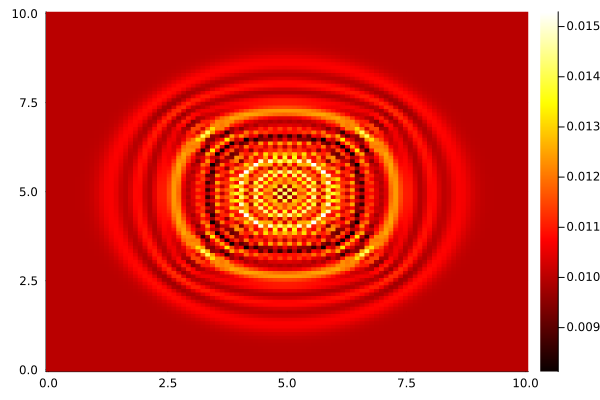

In [54]:
Plots.heatmap(xs,xs,U[:,:,mid,nt]',levels=[-10*dt^2,10*dt^2],c=:hot)

[ Info: Saved animation to C:\Users\Arif\OneDrive - Instituto Tecnologico y de Estudios Superiores de Monterrey\Files\Escuela\Carrera\4to Semestre\Electrodinamica\proyectos\Onda electroMag\cargaenmov2.gif


Plots.AnimatedGif("C:\\Users\\Arif\\OneDrive - Instituto Tecnologico y de Estudios Superiores de Monterrey\\Files\\Escuela\\Carrera\\4to Semestre\\Electrodinamica\\proyectos\\Onda electroMag\\cargaenmov2.gif")
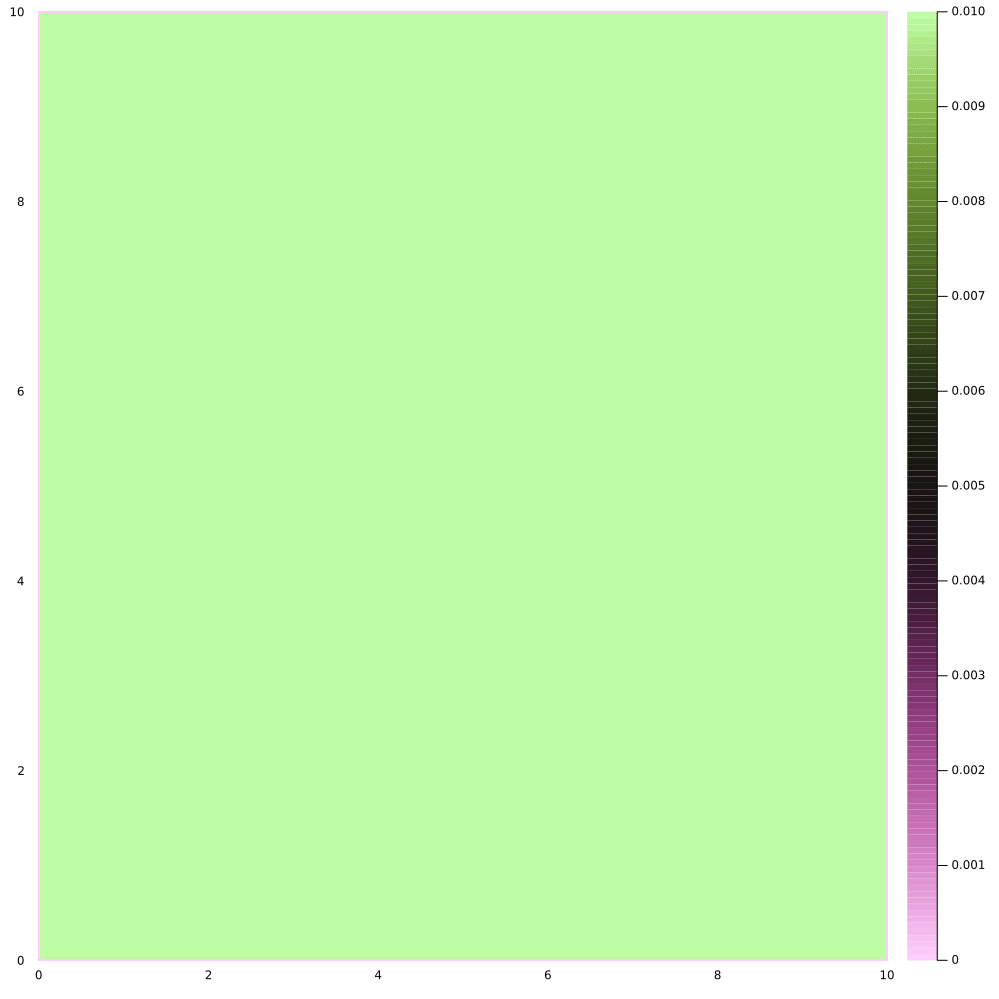

In [60]:
arr=range(1,nx,step=2)
anim2d=@animate for i in 1:2:nt-1;
    #Plots.heatmap(xs,xs,U[:,:,mid,i]',levels=200,c=:hot,size=(1000,1000),clims=(-10*dt^2, 10*dt^2))#levels=[0,dt^2],c=:hot,clims=(0, dt^2,)
    Plots.contourf(xs,xs,U[:,:,mid,i]',c=:vanimo,levels=150,size=(1000,1000))
    #EE=-Ef(U[:,:,:,i]).-[dA[1][:,:,:,i],dA[2][:,:,:,i],dA[3][:,:,:,i]]#-[Ax[:,:,:,i],Ay[:,:,:,i],Az[:,:,:,i]];
    #Plots.quiver!(X[arr,arr,mid],Y[arr,arr,mid],quiver=(E[1][arr,arr,mid,i], E[2][arr,arr,mid,i]).*0.08,la=0.6,color="black")
end;
gif(anim2d,"cargaenmov2.gif",fps=24)

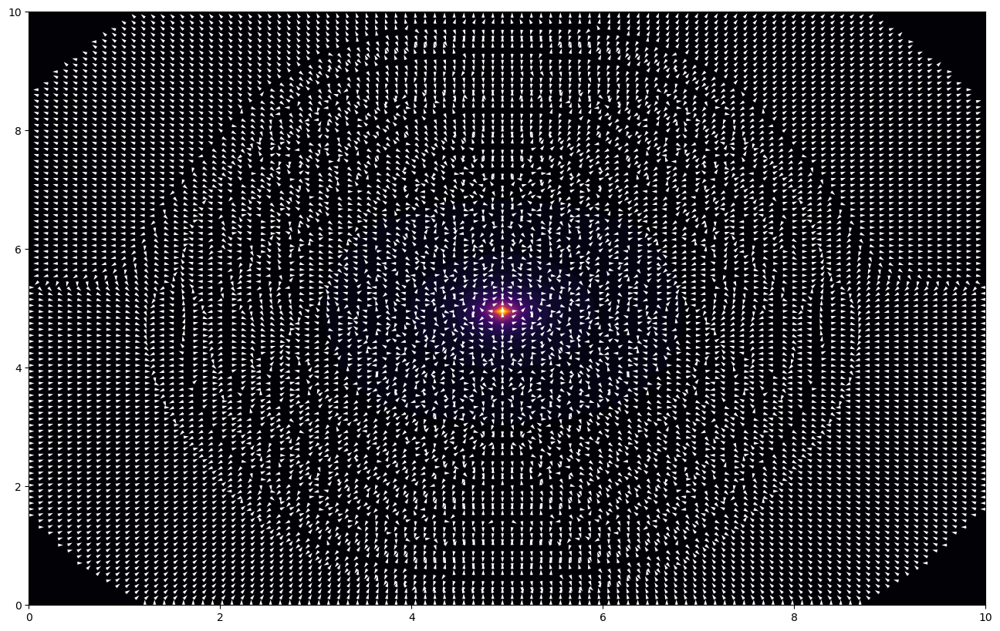

PyObject <matplotlib.quiver.Quiver object at 0x00000154E1019BD0>

In [305]:
using PyCall, PyPlot
fig = PyPlot.figure(figsize=(16,10))
ax = fig.add_subplot(111)
ii=nt
plt.contourf(X[:,:,mid],Y[:,:,mid],U[:,:,mid,ii],levels=50,cmap="inferno")
#EE=-Ef(U[:,:,:,ii]).-[dA[1][:,:,:,i],dA[2][:,:,:,i],dA[3][:,:,:,i]];
#plt.streamplot(X[:,:,mid]',Y[:,:,mid]',E[1][:,:,mid,ii]',E[2][:,:,mid,ii]',color="white",density=3,linewidth=1)
plt.quiver(X[:,:,mid]',Y[:,:,mid]',E[1][:,:,mid,ii]',E[2][:,:,mid,ii]',color="white")

In [103]:
# Generate kernel
function generate_kernel(n::Int)
    kernel = zeros(Float64, n, n, n)
    
    kernel[1:3, 2, 2] .= 1/6
    kernel[2, 1:3, 2] .= 1/6
    kernel[2, 2, 1:3] .= 1/6
    kernel[2, 2, 2] = 0.0
    return kernel
end

kern = generate_kernel(3);




In [117]:
kern

3×3×3 Array{Float64, 3}:
[:, :, 1] =
 0.0  0.0       0.0
 0.0  0.166667  0.0
 0.0  0.0       0.0

[:, :, 2] =
 0.0       0.166667  0.0
 0.166667  0.0       0.166667
 0.0       0.166667  0.0

[:, :, 3] =
 0.0  0.0       0.0
 0.0  0.166667  0.0
 0.0  0.0       0.0

In [279]:
function gradient(potential::Array{T, 4}) where T
    nx, ny, nz, nt = size(potential)
    dx = h  # Assuming uniform spacing along x-direction
    dy =h  # Assuming uniform spacing along y-direction
    dz = h  # Assuming uniform spacing along z-direction

    grad_x = similar(potential)
    grad_y = similar(potential)
    grad_z = similar(potential)

    for t in 1:nt
        for k in 1:nx
            for j in 1:ny
                for i in 1:nz
                    # Central differences for x-direction
                    if k == 1
                        grad_x[k, j, i, t] = (potential[k+1, j, i, t] - potential[k, j, i, t]) / dx
                    elseif k == nx
                        grad_x[k, j, i, t] = (potential[k, j, i, t] - potential[k-1, j, i, t]) / dx
                    else
                        grad_x[k, j, i, t] = (potential[k+1, j, i, t] - potential[k-1, j, i, t]) / (2*dx)
                    end

                    # Central differences for y-direction
                    if j == 1
                        grad_y[k, j, i, t] = (potential[k, j+1, i, t] - potential[k, j, i, t]) / dy
                    elseif j == ny
                        grad_y[k, j, i, t] = (potential[k, j, i, t] - potential[k, j-1, i, t]) / dy
                    else
                        grad_y[k, j, i, t] = (potential[k, j+1, i, t] - potential[k, j-1, i, t]) / (2*dy)
                    end

                    # Central differences for z-direction
                    if i == 1
                        grad_z[k, j, i, t] = (potential[k, j, i+1, t] - potential[k, j, i, t]) / dz
                    elseif i == nz
                        grad_z[k, j, i, t] = (potential[k, j, i, t] - potential[k, j, i-1, t]) / dz
                    else
                        grad_z[k, j, i, t] = (potential[k, j, i+1, t] - potential[k, j, i-1, t]) / (2*dz)
                    end
                end
            end
        end
    end
    M=sqrt.(grad_x.^2+grad_y.^2+grad_z.^2)
    return [grad_x./M, grad_y./M, grad_z./M]
end


gradient (generic function with 1 method)

In [281]:
E= (gradient(U)).*(-1);
